Mustafa Yetişir
22.10.2022

In this project, I did some simple image manipulations like histogram equalization, conditional scaling, local max and min operations.

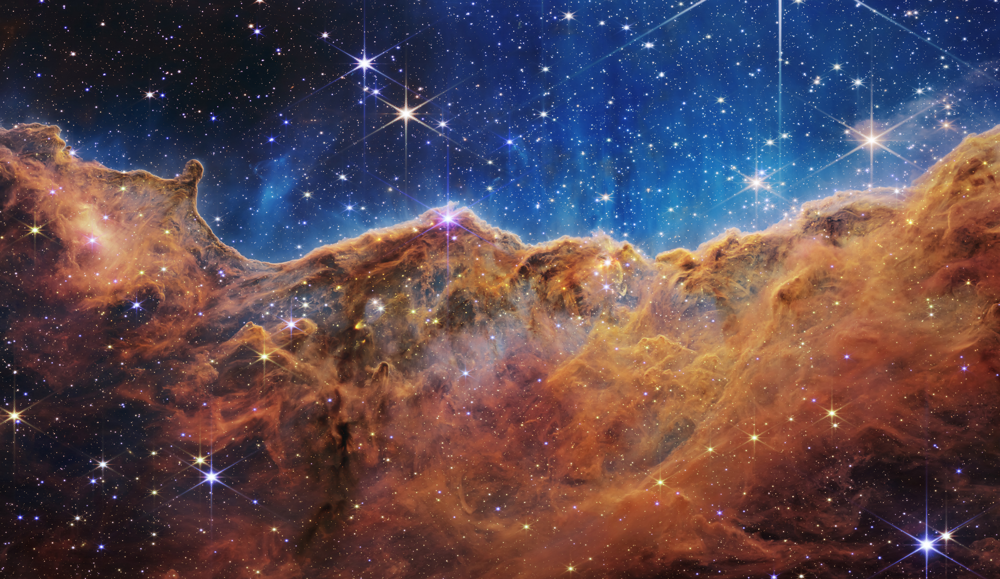

In [89]:
from PIL.Image import Image as ImageType
from PIL import Image
import numpy as np

from utils import image_to_array, array_to_image, render_question_1


input_image = Image.open("images/webbJamesImage.jpeg")
input_image

In [3]:
from PIL.Image import Image as ImageType
from PIL import Image
import numpy as np

from utils import image_to_array, array_to_image, render_question_1

def gray_scale_i(image: ImageType) -> ImageType:
    imarray = image_to_array(image)
    width, height = imarray.shape[:2] #took width and height of the array of input image
    new = np.zeros([width, height, 2]) #created a new array with zeros with the same width and height and,
    #we created it with only 2 channels, 1 channel for grey level, 1 channel for alpha value(opacity value)
    
    for x in range (width):
        for y in range (height):
            channels = [float(imarray[x][y][0]), float(imarray[x][y][1]), float(imarray[x][y][2])]
            avg = (channels[0]+channels[1]+channels[2])/3
            new[x][y][0]=avg
            new[x][y][1]=255
            
    finalimage = array_to_image(new) #turning array to image back 
    return finalimage


def gray_scale_ii(image: ImageType) -> ImageType:
    imarray = image_to_array(image)
    width, height = imarray.shape[:2]
    new = np.zeros([width, height, 2])
    for x in range (width):
        for y in range (height):
            channels = [float(imarray[x][y][2]), float(imarray[x][y][1]), float(imarray[x][y][0])]
            #in numpy, the channels are BGR, not RGB; therefore we need to arrange our channels according to that
            #We put R channel in the first and B channel to 3rd place in our channels array
            #channels = {R,G,B} now, so that we can aply the given formula in Q1-ii as it is
            avg = 0.299 *  channels[0] + 0.587 * channels[1] + 0.114 * channels[2]
            new[x][y][0] = avg
            new[x][y][1] = 255 #arranging alpha channel as 255 so that the image is fully opaque
    finalimage = array_to_image(new) #turning array to image back 
    return finalimage

input_image = Image.open("images/webbJamesImage.jpeg")

gray_image_i = gray_scale_i(input_image)
gray_image_ii = gray_scale_ii(input_image)

render_question_1(gray_image_i, gray_image_ii)


Implement Histogram Equalization.

In [ ]:
from PIL.Image import Image as ImageType
from PIL import Image
import numpy as np

from utils import image_to_array, array_to_image, render_question_2


input_image = Image.open("images/low_contrast.jpeg")


def calculate_density(image_array: np.ndarray, min_gray: int = 0, max_gray: int = 255) -> np.ndarray:
    """ Calculate the gray level density values.
        NOTE: You can use ```np.unique``` function to count frequencies.

    Args:
        image_array (np.ndarray): (2D) input image array
        min_gray (int, optional): Minimum gray level. Defaults to 0.
        max_gray (int, optional): Maximum gray level. Defaults to 255.

    Returns:
        np.array: A 1D array of shape (max + 1 - min,) that contains the density values
            of gray levels
    """

    my_img = np.copy(image_array)
    my_img = my_img.flatten()

    freqs = np.zeros(max_gray + 1 - min_gray)

    for i in range(max_gray+1-min_gray):
        freqs[i] = list(my_img).count(i+min_gray)

    return freqs


def histogram_equalization(image: ImageType) -> ImageType:
    """ Histogram Equalization algorithm

    Args:
        image (ImageType): input image

    Returns:
        ImageType: transformed image with uniform density
    """

    image_array = image_to_array(image)
    img = np.copy(image_array)
    min_value = int(np.amin(img))
    max_value = int(np.amax(img))

    density_array = calculate_density(image_array, min_value, max_value)

    
    org_shape = img.shape
    img = img.flatten()

    cdf = np.zeros(256)

    for i in range(density_array.shape[0]):
        cdf[i+min_value] = sum(density_array[:i])
    
    for i in range(img.shape[0]):
        img[i] = cdf[int(img[i])]

    new_img = np.reshape(img, org_shape)
    return array_to_image(new_img)
   


uniform_image = histogram_equalization(input_image)
render_question_2(input_image,
                  calculate_density(image_to_array(input_image)),
                  uniform_image,
                  calculate_density(image_to_array(uniform_image)),
                  )


Conditional scaling.

In [2]:
from PIL.Image import Image as ImageType
from PIL import Image
import numpy as np

from utils import image_to_array, array_to_image, render_question_3

reference_image = Image.open("images/max-plank.jpeg")  # Image I
input_image = Image.open("images/einstein.jpg")  # Image J

def conditional_scaling(reference_image:ImageType, input_image:ImageType) -> ImageType:
    
    ref_im_array = image_to_array(reference_image)
    in_im_array = image_to_array(input_image)
    #transform images to numpy arrays using helper function image_to_array
    
    ref_mean = np.mean(ref_im_array)
    in_mean = np.mean(in_im_array)
    ref_std = np.std(ref_im_array)
    in_std = np.std(in_im_array)
    #calculated means and std's of input and reference images
    
    a = (ref_mean * in_std / ref_std ) - in_mean
    b = ref_std / in_std 
    #using these a and b, we will create the g(u) = b(u+a) and make conditional scaling using that g function 
    
    w_input, h_input = in_im_array.shape[:2]
    new = np.zeros([w_input, h_input, 2]) #created a new array with zeros with the same width and height as input image and,
    #we created it with only 2 channels, 1 channel for grey level, 1 channel for alpha value(opacity value)
    
    for x in range(w_input):
        for y in range(h_input):
            new[x][y][0] = b * (in_im_array[x][y] + a) #apply g(u) to each pixels of input image 
            new[x][y][1] = 255
    clipped = np.clip(new,0,255)
    final_image = array_to_image(clipped)
    return final_image



scaled_image = conditional_scaling(reference_image, input_image)

ar_scaled_image = image_to_array(scaled_image)
ref_array = image_to_array(reference_image)
in_array=image_to_array(input_image)

print( np.std(ar_scaled_image), np.mean(ar_scaled_image))
print("-------------------------------------")
print(np.std(ref_array), np.mean(ref_array))

render_question_3(input_image, scaled_image, reference_image)



106.63809933640768 153.414553125
-------------------------------------
62.64421226220795 40.79077932385357


Local max and local min operations.

In [1]:
from typing import Callable
from PIL.Image import Image as ImageType
from PIL import Image
import numpy as np

from utils import image_to_array, array_to_image, render_question_4

input_image_1 = Image.open("images/noisy_einstein.jpg")
input_image_2 = Image.open("images/salty_einstein.jpg")


def local_filter(image: ImageType, k: int, np_reduce: Callable[[np.ndarray], np.ndarray]) -> ImageType:
    """ Local filter with a odd length square kernel.
        NOTE: You can use ```np.meshgrid``` and indexing to avoid using for-loops (bonus +10).
        **Do not** use ```np.convolve``` in this question.

    Args:
        image (ImageType): Input image
        k (int): Half kernel size. The kernel size is 2 * k + 1.
        np_reduce (Callable[[np.ndarray], np.ndarray]): np.mean, np.max, or np.min functions
    
    Raises:
        ValueError: If kernel size is less than 1

    Returns:
        ImageType: Filtered Image
    """
    filter_size = 2 * k + 1
    if(filter_size < 1):
        raise ValueError
        
    filter = np.zeros([filter_size, filter_size, 1])
    
    array = image_to_array(image)
    width, height = array.shape[:2]
    new = np.zeros([width, height, 2])
    
    for x in range(width-k):
        for y in range(height-k):
            for i in range(filter_size):
                for j in range(filter_size):
                    filter[i][j]= array[x-k+i][y-k+j]
        
            filtered = np_reduce(filter)
            new[x][y][0] = filtered
            new[x][y][1] = 255 #Inside these nested loops, we fullfill the filter according to the x y position of 
#the input image and kernel size, then filter the filter kernel according to input np_reduce function.
#Finally, we fill our new array with the size of input array with filtered values."""
    final_image = array_to_image(new) 
    return final_image


render_question_4(local_filter, [input_image_1, input_image_2])
